In [1]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

In [2]:
# Load the image
from google.colab import files
uploaded = files.upload()

Saving Kidnay_2(2)_x20.tif to Kidnay_2(2)_x20.tif


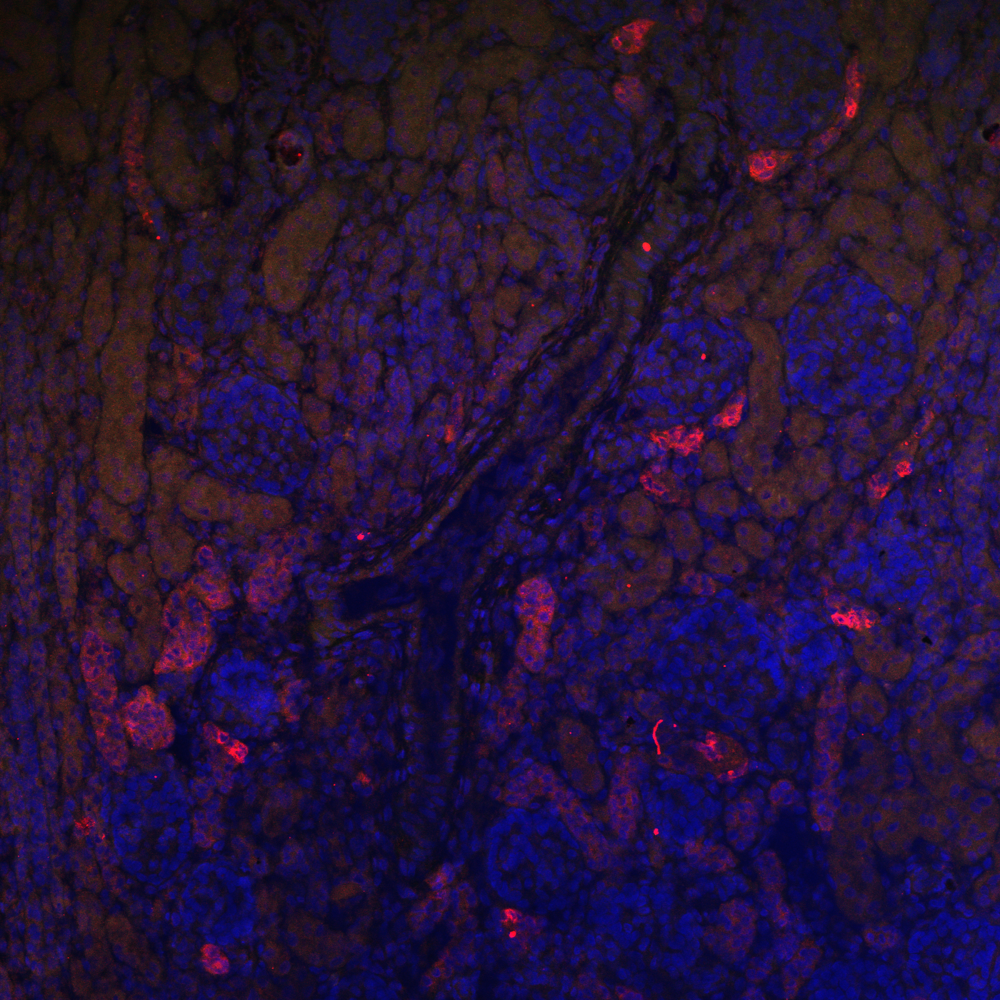

In [3]:
image = cv2.imread(list(uploaded.keys())[0], 1)
cv2_imshow(image)

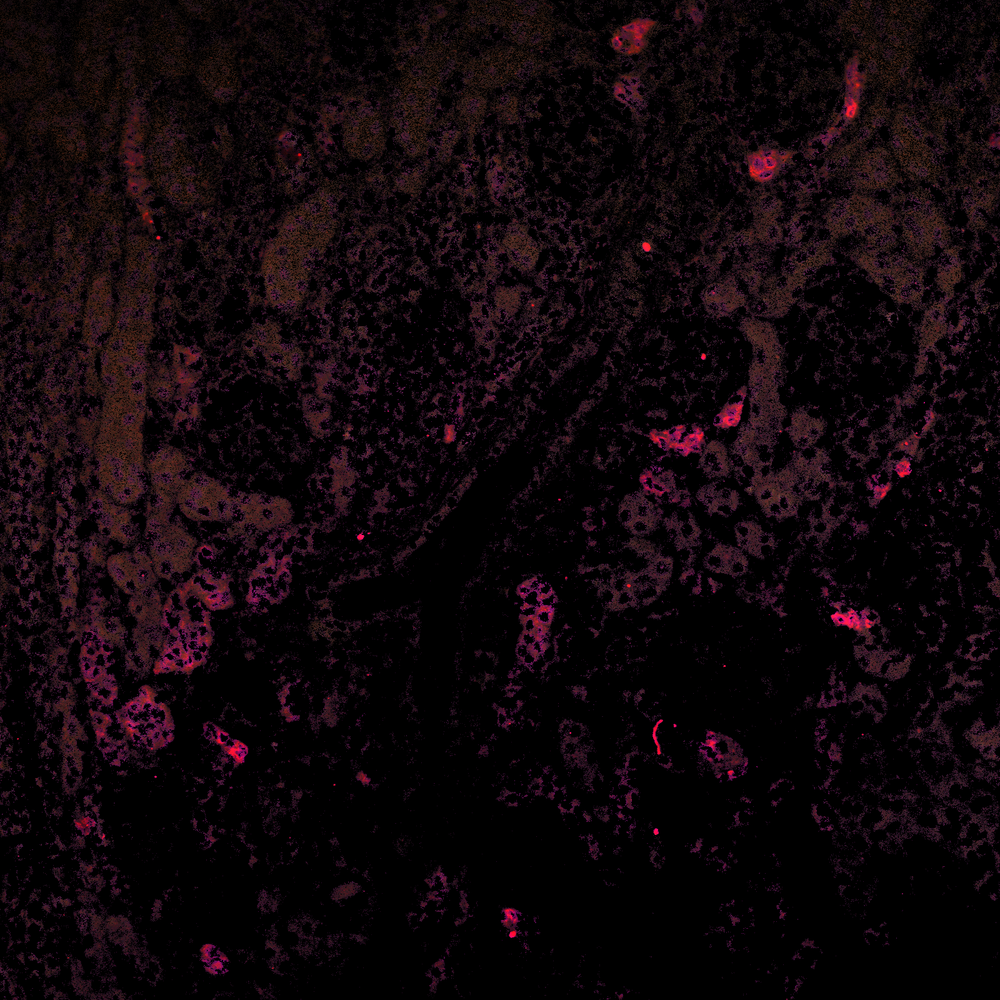

In [4]:
# Convert the image to the HSV color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the lower and upper bounds for the red color range
lower_red = np.array([0, 80, 15])
upper_red = np.array([12, 255, 255])
lower_red2 = np.array([150, 80, 15])
upper_red2 = np.array([180, 255, 255])

# Create a mask for the red color range
red_mask_1 = cv2.inRange(hsv_image, lower_red, upper_red)
red_mask_2 = cv2.inRange(hsv_image, lower_red2, upper_red2)
red_mask = cv2.bitwise_or(red_mask_1, red_mask_2)

red_image = cv2.bitwise_and(image, image, mask = red_mask)

cv2_imshow(red_image)

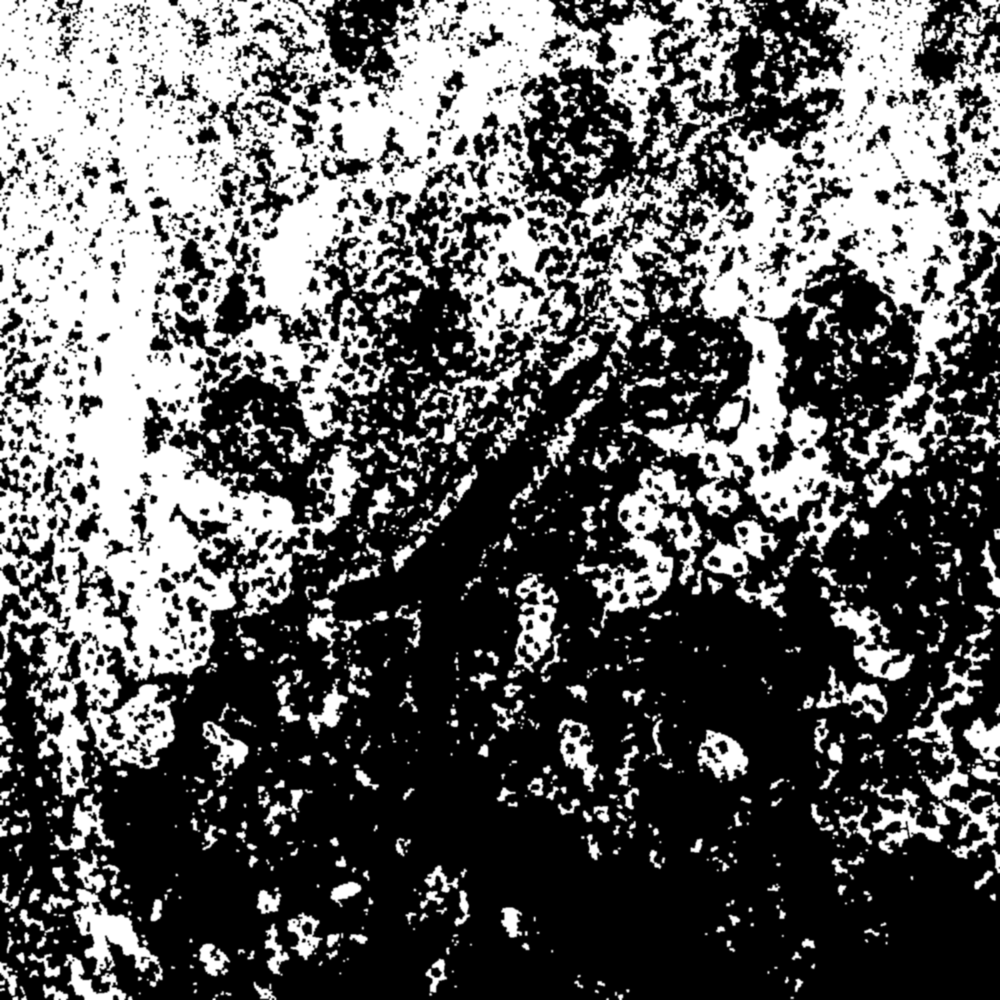

In [5]:
# Perform morphological operations to remove noise
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
processed_mask = red_mask.copy()

processed_mask = cv2.morphologyEx(processed_mask, cv2.MORPH_CLOSE, kernel)
processed_mask = cv2.morphologyEx(processed_mask, cv2.MORPH_OPEN, kernel)

# Apply Gaussian blur
blurred_mask = cv2.GaussianBlur(processed_mask, (5,5), 0)

cv2_imshow(blurred_mask)

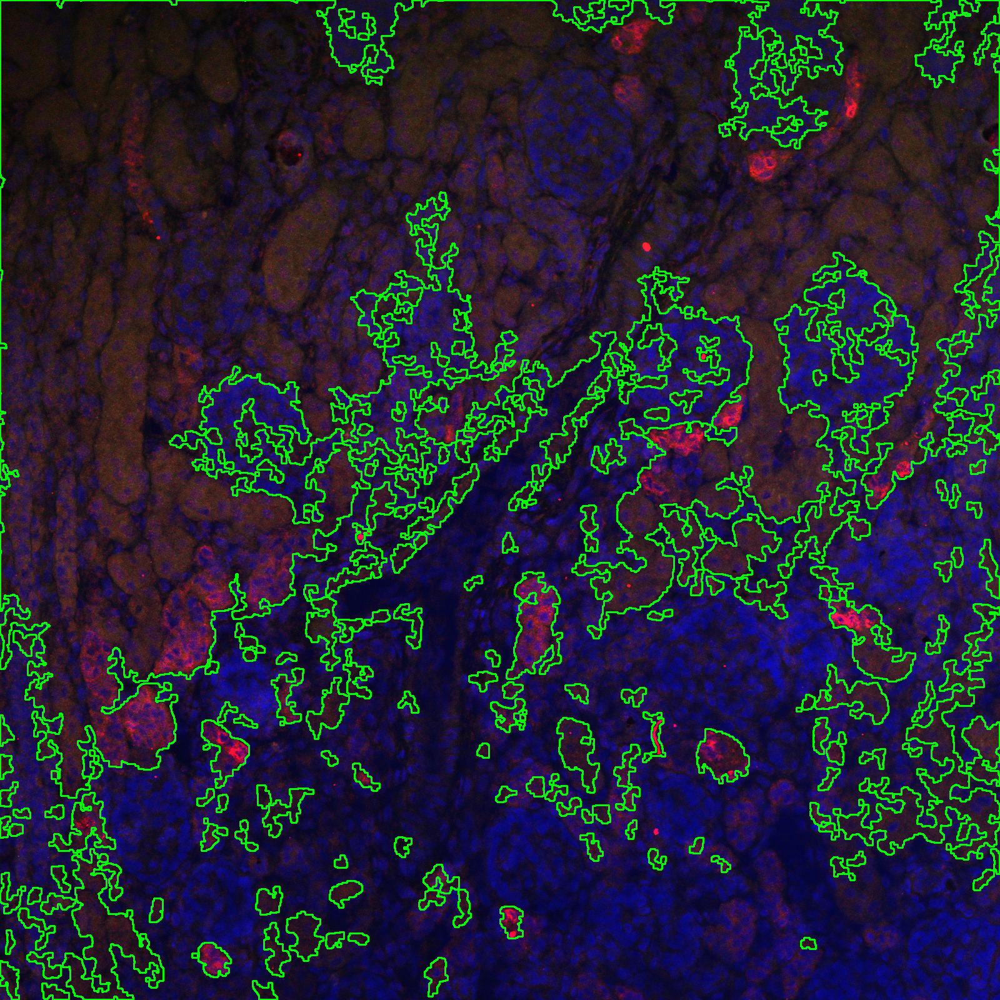

In [6]:
# Find contours
contours, _ = cv2.findContours(blurred_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter contours based on area
min_contour_area = 300
filtered_contours = []
for contour in contours:
    area = cv2.contourArea(contour)
    if area > min_contour_area:
        filtered_contours.append(contour)

contoured_image = image.copy()
# Draw contours on the image
cv2.drawContours(contoured_image, filtered_contours, -1, (0, 255, 0), 2)

cv2_imshow(contoured_image)

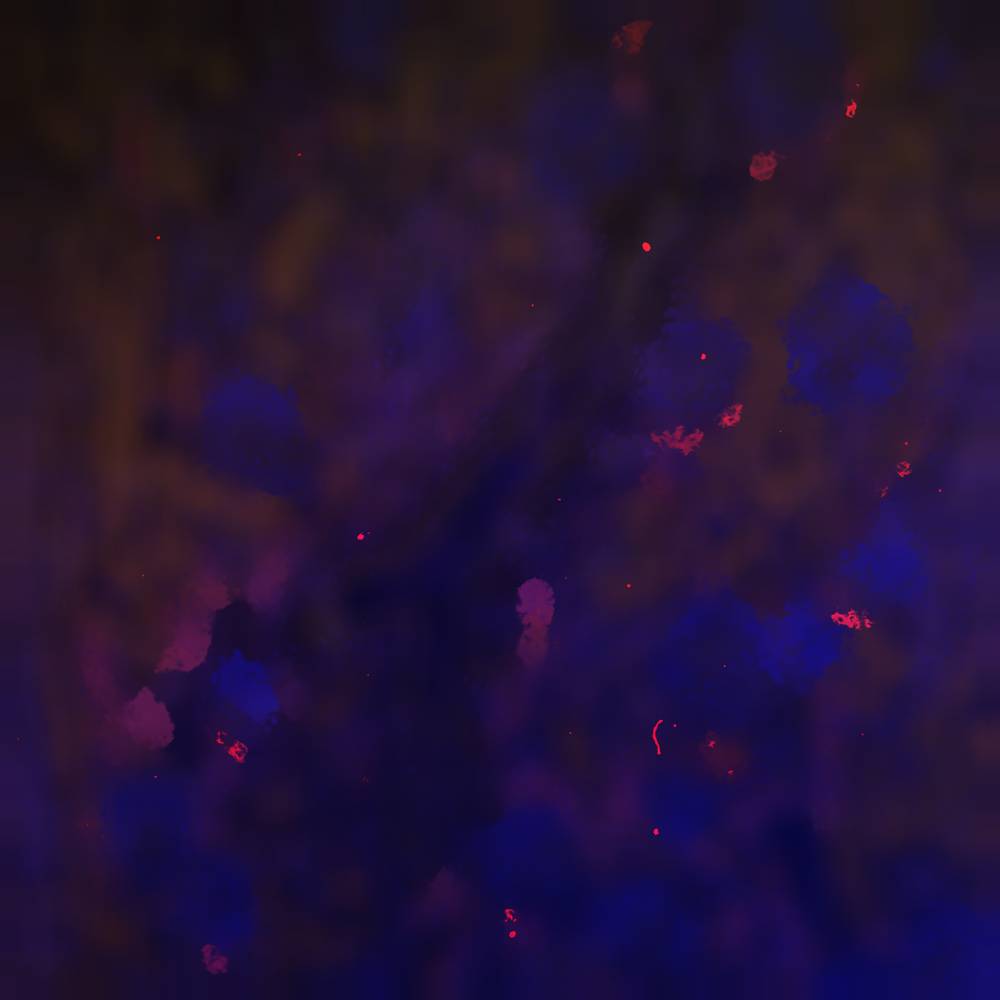

In [7]:
mean_shift = cv2.pyrMeanShiftFiltering(image, 30, 60, 3)
cv2_imshow(mean_shift)

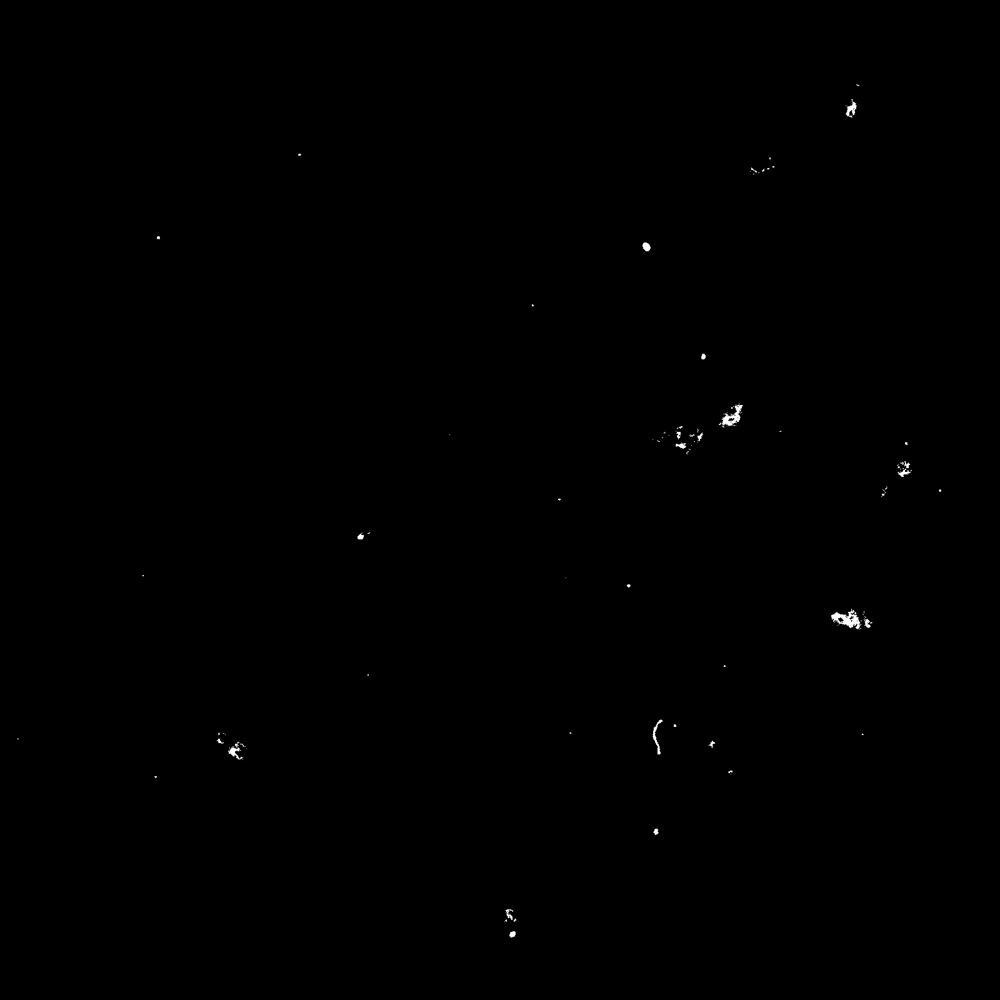

In [8]:
gray_mean_shift = cv2.cvtColor(mean_shift, cv2.COLOR_BGR2GRAY)
_, bin_mean_shift = cv2.threshold(gray_mean_shift, 60, 255, cv2.THRESH_BINARY)
cv2_imshow(bin_mean_shift)